In [1]:
# DIRECTORIES

RealImagesDir = "/mnt/DADES2/STELA/data"
RealImagesJsonDir = "/mnt/DADES2/STELA/data/STELA_DATASET.json"

In [2]:
# LIBRARIES
import random
import os
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel,UniPCMultistepScheduler
import torch
# import torch

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import NewPal as ft
import json
from diffusers.utils import load_image, make_image_grid


import numpy as np
from PIL import Image, ImageDraw, ImageFilter
import matplotlib.pyplot as plt

/mnt/DADES/home/jgarcia/LoraEnv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


VERSION=2

NewPal,50



In [3]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda:0")  # You can change the index if you have more GPUs
    print("CUDA Device Name:", torch.cuda.get_device_name(device))
    print("Memoria Total (MB):", torch.cuda.get_device_properties(0).total_memory // (1024 ** 2))
else:
    print("No CUDA device available")

CUDA Device Name: NVIDIA GeForce RTX 3090
Memoria Total (MB): 24161


In [4]:
# FUNCTIONS

def image_grid(imgs, prompt_len):
    # Calculate rows and columns dynamically based on the length of the prompt
    cols = 2  # Adjust number of columns as needed
    rows = (prompt_len + cols - 1) // cols  # Compute number of rows

    assert len(imgs) == prompt_len

    # Create a new figure to plot the images
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))  # Adjust size if needed

    # If only one row or one column, axes will not be an array
    axes = axes.flatten()

    for i, img in enumerate(imgs):
        # Convert numpy array to Image if needed
        if isinstance(img, np.ndarray):
            img = Image.fromarray(img)

        # Plot image on the corresponding axis
        axes[i].imshow(img)
        axes[i].axis("off")  # Hide axis for better visualization
        axes[i].set_title(f"Image {i+1}")  # Optional: Set title for each image

    # Turn off axes for any remaining empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

def drawText(string, x, y, ix, iy, scale, color, icolor, digit_spacing=10):
    for i, c in enumerate(string):
        ft.drawCode(c, x, y, scale, color, alpha = 0.5)
        
        # Determine spacing
        extra_spacing = digit_spacing if c!=" " else 0
        x += ix + ft.getCodeWidth(c, scale) + extra_spacing
        y += iy

        if icolor is not None:
            color = tuple(np.array(color) + np.array(icolor))


def Image2Canny(image, drawing_region, code, font_scale, line_spacing=10):  # 🌟 You can change 10 to any value you like
    # Mask the current ID code
    polygon_points = [(x, y) for label, x, y in drawing_region]
    mask = Image.new('L', image.size, 0) 
    ImageDraw.Draw(mask).polygon(polygon_points, fill=255)

    image_rgb = image.convert("RGB")
    blurred_image = image_rgb.filter(ImageFilter.GaussianBlur(radius=15))  
    final_image = Image.composite(blurred_image, image_rgb, mask)
    image_np = np.array(final_image)

    # Text drawing setup
    font = cv2.FONT_HERSHEY_SIMPLEX
    thickness = 2
    text_color = (255, 255, 255)

    (x0, y0) = (drawing_region[0][1], drawing_region[0][2])
    (x2, y2) = (drawing_region[2][1], drawing_region[2][2])
    region_width = x2 - x0
    region_height = y2 - y0

    code_lines = code.split('\n')
    (text_width, text_height), baseline = cv2.getTextSize(code_lines[0], font, font_scale, thickness)
    
    total_text_height = len(code_lines) * (text_height + baseline + line_spacing) - line_spacing
    y_start = y0 + (region_height - total_text_height) // 2 + text_height

    for i, line in enumerate(code_lines):
        (line_width, _), _ = cv2.getTextSize(line, font, font_scale, thickness)
        x = x0 + (region_width - line_width) // 2
        y = y_start + i * (text_height + baseline + line_spacing)
        cv2.putText(image_np, line, (x, y), font, font_scale, text_color, thickness, cv2.LINE_AA)

    gray_with_text = cv2.cvtColor(image_np, cv2.COLOR_BGR2GRAY)
    canny_result = cv2.Canny(gray_with_text, threshold1=10, threshold2=80)
    final_edge_image = Image.fromarray(canny_result).convert("RGB")

    return image, final_image, final_edge_image

def save_image(image, image_name, output_dir="/mnt/DADES/home/jgarcia/CODE/6) STYLE TRANSFER/Paper Figures"):
    """
    Save an image to the specified directory.
    Args:
        image (numpy.ndarray or PIL.Image): The image to save.
        image_name (str): The name of the file to save the image as.
        output_dir (str): The directory where the image will be saved.
    """
    if isinstance(image, np.ndarray):
        image = Image.fromarray(image)
    
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)
    
    # Save the image
    image_path = os.path.join(output_dir, image_name)
    image.save(image_path)
    print(f"Image saved to {image_path}")

def CannyCodeExperiment(code, x, y, mask_size, scale=1.0, digit_spacing=5):
    """
    Draws text with soft blur and applies a Canny edge detector.
    
    Parameters:
    - code: str - The text code to render
    - x, y: int - Starting position for the text
    - mask_size: (width, height) - Size of the blank mask
    - scale: float - Text scale (default 1.0)
    - digit_spacing: int - Extra spacing between digits
    """
    def drawTextSoftBlur(string, x, y, ix, iy, scale, color, icolor, digit_spacing=5, canvas_shape=(512, 512)):
        """Draws bold text with soft blur, tracks character positions."""

        h, w = canvas_shape[:2]
        drawn_chars = []  # 🌸 We'll store [char, [x, y]] here

        for i, c in enumerate(string):
            code_width = ft.getCodeWidth(c, scale)
            code_height = ft.getCodeHeight(c, scale) if hasattr(ft, "getCodeHeight") else 50 * scale

            # Check bounds before drawing
            if 0 <= x < w and 0 <= y < h and x + code_width < w and y + code_height < h:
                ft.drawCode(c, x, y, scale, color, alpha=0.8)
                ft.drawCode(c, x + 1, y + 1, scale, color, alpha=0.8)

                # 💕 Save character and bottom-left corner
                if c != " ":
                    drawn_chars.append([c, int(x), int(y)])

            extra_spacing = digit_spacing if c != " " else 0
            x += ix + code_width + extra_spacing
            y += iy

            if icolor is not None:
                color = tuple(np.clip(np.array(color) + np.array(icolor), 0, 255))

        return drawn_chars


        # Prepare mask
    mask = np.zeros(mask_size, dtype=np.uint8)

    # Prepare text lines
    code_lines = [add_spaces(line) for line in code.split('\n')]

    # Drawing setup
    color = (1, 1, 1)       # white 💮
    icolor = (0, 0, 0)      # no inner color change
    space = scale * -5 / 0.67

    # Plotting
    fig, ax = plt.subplots(figsize=(8, 6), dpi=100)
    ax.set_position([0, 0, 1, 1])
    ax.imshow(mask, cmap='gray', aspect='auto')
    ax.axis('off')

    cur_y = y
    json_data = {"chars": [], "code": code, "scale": scale}

    for line in code_lines:
        chars = drawTextSoftBlur(line, x, cur_y, space, 0, scale, color, icolor, digit_spacing, canvas_shape=mask_size)
        cur_y += scale * 80 / 1.08
        json_data["chars"].append(chars)

    json_data["chars"] = [item for sublist in json_data["chars"] for item in sublist]

    # Render and convert
    fig.canvas.draw()
    fused_img = np.array(fig.canvas.renderer.buffer_rgba())
    plt.close(fig)

    # Image processing
    fused_img = cv2.cvtColor(fused_img, cv2.COLOR_RGBA2BGR)
    dilated_mask = cv2.dilate(fused_img, np.ones((3, 3), np.uint8), iterations=1)
    canny_result = cv2.Canny(dilated_mask, threshold1=10, threshold2=80)

    return canny_result, json_data

# READ DATA

try:
    with open(RealImagesJsonDir, "r") as f: 
        Annotations = json.load(f)
        i = len(Annotations)
        print("JSON file loaded successfully.")
        print(f"Number of entries: {i}")

except FileNotFoundError:
    print("JSON file not found.")

JSON file loaded successfully.
Number of entries: 1696


## Text-to-image with Stable Diffusion 3.5 large

In [5]:
from diffusers import AutoPipelineForText2Image
from diffusers.utils import load_image
import torch

torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

pipeline = AutoPipelineForText2Image.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16)
pipeline.enable_model_cpu_offload()

pipeline.to(device)

Loading pipeline components...: 100%|██████████| 7/7 [00:14<00:00,  2.08s/it]
It seems like you have activated model offloading by calling `enable_model_cpu_offload`, but are now manually moving the pipeline to GPU. It is strongly recommended against doing so as memory gains from offloading are likely to be lost. Offloading automatically takes care of moving the individual components vae, text_encoder, text_encoder_2, tokenizer, tokenizer_2, unet, scheduler, image_encoder, feature_extractor to GPU when needed. To make sure offloading works as expected, you should consider moving the pipeline back to CPU: `pipeline.to('cpu')` or removing the move altogether if you use offloading.


StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.34.0.dev0",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

100%|██████████| 20/20 [00:06<00:00,  3.09it/s]


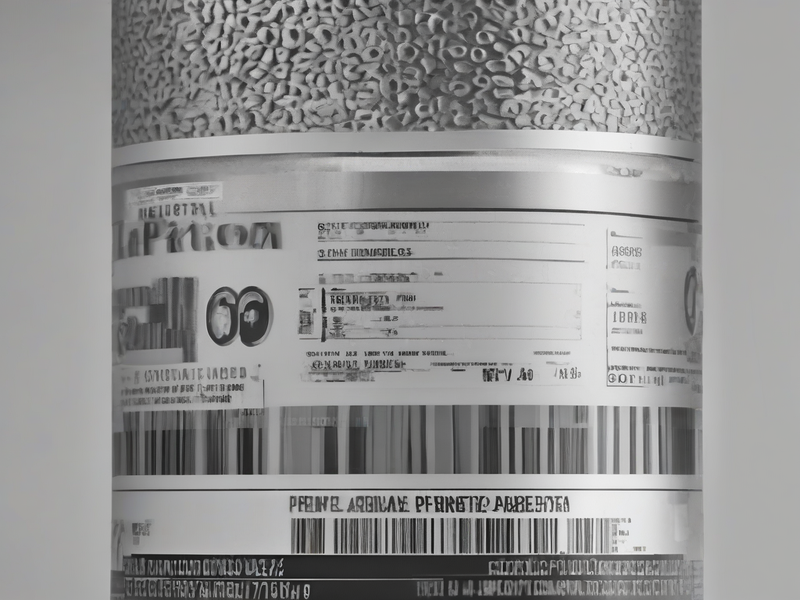

In [53]:
prompt = (
    "laser-printed code area on product packaging"
)

prompt = (
    "A high-quality grayscale photo of an industrial package. "
    "The image shows a close-up of the label laser-printed on the package. "
)

image = pipeline(
    prompt=prompt,
    num_inference_steps=20,
).images[0]

image = image.resize((800, 600), Image.LANCZOS)
make_image_grid([image], rows=1, cols=1)

In [54]:
save_image(image, "text2image_11.png")

Image saved to /mnt/DADES/home/jgarcia/CODE/6) STYLE TRANSFER/Paper Figures/text2image_11.png


## ControlNet + Stable Diffusion 3.5 large

In [8]:
import torch
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, AutoencoderKL
from diffusers.utils import load_image
from diffusers.image_processor import VaeImageProcessor

class SD3CannyImageProcessor(VaeImageProcessor):
    def __init__(self):
        super().__init__(do_normalize=False)
    def preprocess(self, image, **kwargs):
        image = super().preprocess(image, **kwargs)
        image = image * 255 * 0.5 + 0.5
        return image
    def postprocess(self, image, do_denormalize=True, **kwargs):
        do_denormalize = [True] * image.shape[0]
        image = super().postprocess(image, **kwargs, do_denormalize=do_denormalize)
        return image

torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0", torch_dtype=torch.float16
)
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", controlnet=controlnet, vae=vae, torch_dtype=torch.float16
)

pipe.to(device)

pipe.enable_model_cpu_offload()
pipe.image_processor = SD3CannyImageProcessor()

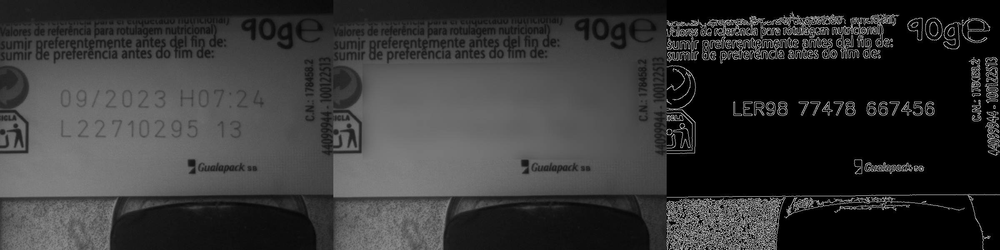

In [15]:
entry = random.choice(list(Annotations.values()))
file = entry["file"]
drawing_region = entry['reserve']

full_path = os.path.join(RealImagesDir, *file.split('\\'))
original_img = Image.open(full_path)

code = "LER98 77478 667456"
font_scale = 1.4

_ , masked_img, control_img =  Image2Canny(original_img, drawing_region, code, font_scale)

make_image_grid([original_img, masked_img, control_img], rows=1, cols=3)

100%|██████████| 30/30 [00:07<00:00,  4.00it/s]


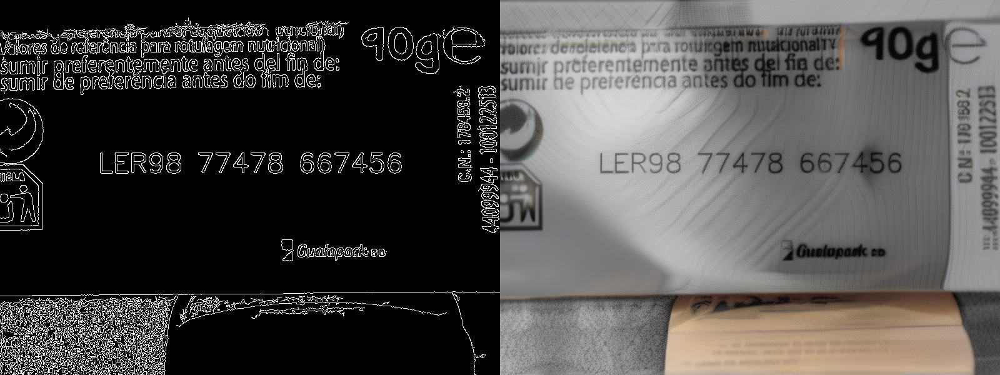

In [16]:
prompt = (
    "A high-quality grayscale photo of an industrial package. "
    "The image shows a close-up of the label laser-printed on the package. "
)

generator = torch.Generator(device="cpu").manual_seed(0)

num_images = 1
generated_imgs = pipe(
    prompt, 
    image=control_img.convert("RGB"), 
    controlnet_conditioning_scale=0.8,
    num_inference_steps=30,
    generator=generator,
    num_images_per_prompt=num_images,
).images


make_image_grid([control_img,  *generated_imgs], rows=1, cols=num_images + 1)

## IP-Adapter + ControlNet + Stable Diffusion XL

In [5]:
from transformers import CLIPVisionModelWithProjection
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel
from transformers import CLIPVisionModelWithProjection
import torch
from diffusers.utils import load_image

torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0", torch_dtype=torch.float16
)

image_encoder = CLIPVisionModelWithProjection.from_pretrained(
    "h94/IP-Adapter",
    subfolder="models/image_encoder",
    torch_dtype=torch.float16
)

pipeline = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    image_encoder=image_encoder,
    controlnet=controlnet, 
    torch_dtype=torch.float16
).to("cuda")

pipeline.load_ip_adapter("h94/IP-Adapter", subfolder="sdxl_models", weight_name="ip-adapter-plus_sdxl_vit-h.safetensors")

pipeline.to(device)

Loading pipeline components...: 100%|██████████| 7/7 [00:44<00:00,  6.41s/it]


StableDiffusionXLControlNetPipeline {
  "_class_name": "StableDiffusionXLControlNetPipeline",
  "_diffusers_version": "0.34.0.dev0",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "controlnet": [
    "diffusers",
    "ControlNetModel"
  ],
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    "transformers",
    "CLIPVisionModelWithProjection"
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

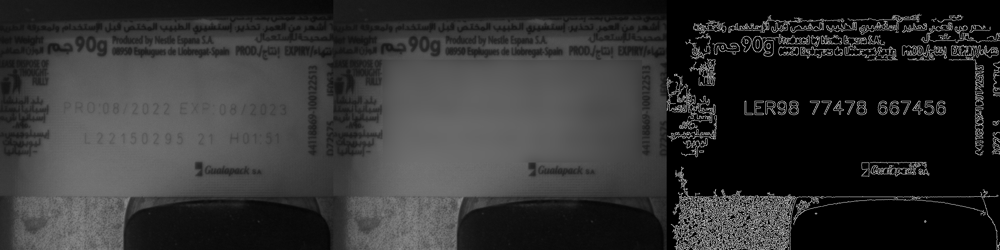

In [6]:
entry = random.choice(list(Annotations.values()))
file = entry["file"]
drawing_region = entry['reserve']

full_path = os.path.join(RealImagesDir, *file.split('\\'))
original_img = Image.open(full_path)

code = "LER98 77478 667456"
font_scale = 1.4

_ , masked_img, control_img =  Image2Canny(original_img, drawing_region, code, font_scale)

make_image_grid([original_img, masked_img, control_img], rows=1, cols=3)

100%|██████████| 60/60 [00:10<00:00,  5.48it/s]


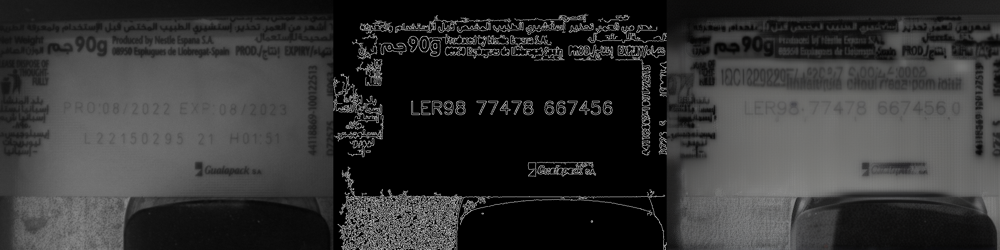

In [11]:
generator = torch.Generator(device="cpu").manual_seed(33)

prompt = (
    "A high-quality grayscale photo of an industrial package ID. "
)

generated_img = pipeline(
    prompt=prompt,
    image=control_img,
    ip_adapter_image=original_img,
    num_inference_steps=60,
    generator=generator,
    controlnet_conditioning_scale=1.1,
).images[0]


generated_img = generated_img.resize((800, 600), Image.LANCZOS)
make_image_grid([original_img, control_img, generated_img], rows=1, cols=3)

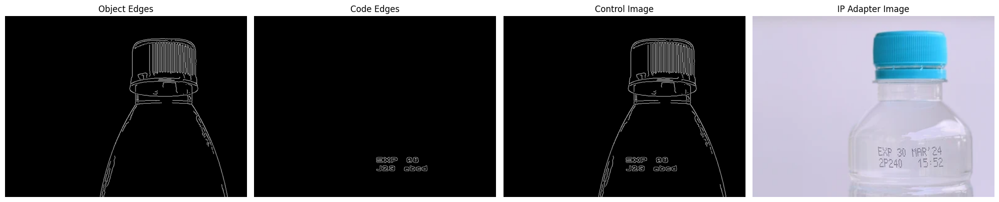

In [ ]:
# New Background Experiment

control_img = "/mnt/DADES/home/jgarcia/CODE/6) STYLE TRANSFER/Styled Images/Canny_bottle.png"
ip_adapter_img = "/mnt/DADES/home/jgarcia/CODE/6) STYLE TRANSFER/Styled Images/bottle_1.png"

control_img = load_image(control_img).convert("RGB").resize((800, 600), Image.LANCZOS)
ip_adapter_img = load_image(ip_adapter_img).convert("RGB").resize((800, 600), Image.LANCZOS)

code = 'EXP 98\nJ23 abcd'
canny_result, _ = CannyCodeExperiment(code,305, 650, (800, 600), scale=0.5, digit_spacing=0)
canny_result = Image.fromarray(canny_result).convert("RGB").resize((800, 600), Image.LANCZOS)

canny_result = np.array(canny_result)
control_img = np.array(control_img)

bitwise_or_result = cv2.bitwise_or(control_img, canny_result)

fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(control_img)
ax[0].set_title("Object Edges")
ax[0].axis("off")
ax[1].imshow(canny_result, cmap='gray')
ax[1].set_title("Code Edges")
ax[1].axis("off")
ax[2].imshow(bitwise_or_result)
ax[2].set_title("Control Image")
ax[2].axis("off")
ax[3].imshow(ip_adapter_img)
ax[3].set_title("IP Adapter Image")
ax[3].axis("off")
plt.tight_layout()
plt.show()

# pill
from PIL import Image, ImageDraw, ImageFont
bitwise_or_result = Image.fromarray(bitwise_or_result)  

# LoRA + ControlNet + Stable Diffusion XL

In [5]:
import torch
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, AutoencoderKL
from diffusers.utils import load_image
from diffusers.image_processor import VaeImageProcessor

class SD3CannyImageProcessor(VaeImageProcessor):
    def __init__(self):
        super().__init__(do_normalize=False)
    def preprocess(self, image, **kwargs):
        image = super().preprocess(image, **kwargs)
        image = image * 255 * 0.5 + 0.5
        return image
    def postprocess(self, image, do_denormalize=True, **kwargs):
        do_denormalize = [True] * image.shape[0]
        image = super().postprocess(image, **kwargs, do_denormalize=do_denormalize)
        return image

torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0", torch_dtype=torch.float16
)
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", controlnet=controlnet, vae=vae, torch_dtype=torch.float16
)

pipe.image_processor = SD3CannyImageProcessor()

model_path = "/mnt/DADES/home/jgarcia/CODE/6) STYLE TRANSFER/LoRA Training/output/checkpoint-16000/pytorch_lora_weights.safetensors"
pipe.unet.load_attn_procs(model_path)

pipe.to(device)

Loading pipeline components...: 100%|███████████████████████████████████████████████████████| 7/7 [00:01<00:00,  3.63it/s]
/mnt/DADES/home/jgarcia/LoraEnv/lib/python3.9/site-packages/diffusers/loaders/unet.py:212: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", deprecation_message)


StableDiffusionXLControlNetPipeline {
  "_class_name": "StableDiffusionXLControlNetPipeline",
  "_diffusers_version": "0.34.0.dev0",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "controlnet": [
    "diffusers",
    "ControlNetModel"
  ],
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

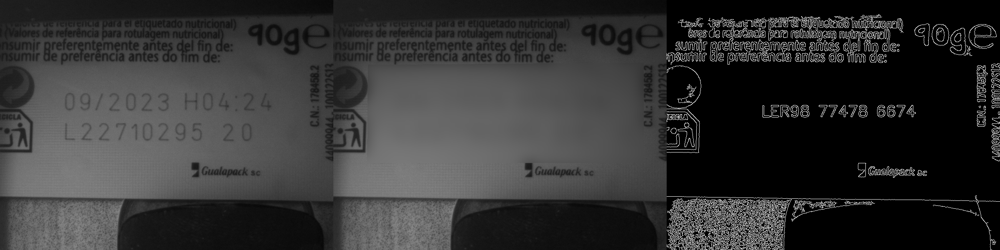

In [8]:
entry = random.choice(list(Annotations.values()))
file = entry["file"]
drawing_region = entry['reserve']

full_path = os.path.join(RealImagesDir, *file.split('\\'))
original_img = Image.open(full_path)

code = "LER98 77478 6674"
font_scale = 1.2

_ , masked_img, control_img =  Image2Canny(original_img, drawing_region, code, font_scale)

make_image_grid([original_img, masked_img, control_img], rows=1, cols=3)

100%|█████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:11<00:00,  5.18it/s]


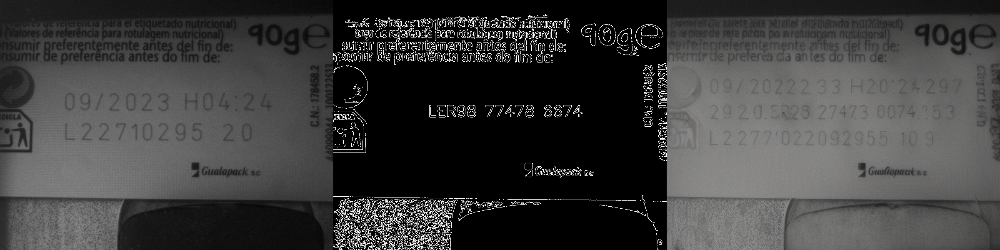

In [12]:
generator = torch.Generator(device="cpu").manual_seed(33)

prompt = (
    "laser-printed code area on consumer product packaging" 
)

generated_img = pipe(
    prompt=prompt,
    image=control_img,
    num_inference_steps=60,
    generator=generator,
    controlnet_conditioning_scale=1.0
).images[0]


generated_img = generated_img.resize((800, 600), Image.LANCZOS)
make_image_grid([original_img, control_img, generated_img], rows=1, cols=3)

# Only LoRA

In [5]:
import torch
from diffusers import StableDiffusionXLPipeline, AutoencoderKL
from diffusers.utils import load_image
from diffusers.image_processor import VaeImageProcessor


class SD3CannyImageProcessor(VaeImageProcessor):
    def __init__(self):
        super().__init__(do_normalize=False)

    def preprocess(self, image, **kwargs):
        image = super().preprocess(image, **kwargs)
        image = image * 255 * 0.5 + 0.5
        return image

    def postprocess(self, image, do_denormalize=True, **kwargs):
        do_denormalize = [True] * image.shape[0]
        image = super().postprocess(image, **kwargs, do_denormalize=do_denormalize)
        return image

# Clear memory 🧼✨
torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

# Load VAE 💖
vae = AutoencoderKL.from_pretrained(
    "madebyollin/sdxl-vae-fp16-fix",
    torch_dtype=torch.float16
)

# Load base SDXL model 🎨
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16
)

# Optional custom image processor 🌷
pipe.image_processor = SD3CannyImageProcessor()

# Load LoRA weights 💪🌟
model_path = "/mnt/DADES/home/jgarcia/CODE/6) STYLE TRANSFER/LoRA Training/output/checkpoint-16000/pytorch_lora_weights.safetensors"
pipe.unet.load_attn_procs(model_path)

# Move to device (make sure you define `device` 💕)
pipe.to("cuda")  # or replace "cuda" with your specific `device` variable


Loading pipeline components...: 100%|███████████████████████████████████████████████████████| 7/7 [00:02<00:00,  3.46it/s]
/mnt/DADES/home/jgarcia/LoraEnv/lib/python3.9/site-packages/diffusers/loaders/unet.py:212: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", deprecation_message)


StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.34.0.dev0",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

100%|█████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:52<00:00,  1.05s/it]


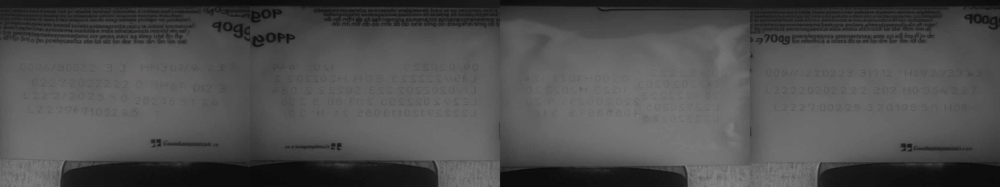

In [19]:

prompt = "laser-printed code area on consumer product packaging" 
num_inference_steps = 50  

generated_imgs = pipe(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    num_images_per_prompt=4
)

generated_list = [
    img.resize((800, 600), Image.LANCZOS) for img in generated_imgs.images
]

make_image_grid(generated_list, rows=1, cols=4)


# LoRA + IP + ControlNet + Stable Diffusion XL

In [7]:
import torch
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, AutoencoderKL
from diffusers.utils import load_image
from diffusers.image_processor import VaeImageProcessor
from transformers import CLIPVisionModelWithProjection

# Custom image processor to match SDXL needs
class SD3CannyImageProcessor(VaeImageProcessor):
    def __init__(self):
        super().__init__(do_normalize=False)

    def preprocess(self, image, **kwargs):
        image = super().preprocess(image, **kwargs)
        image = image * 255 * 0.5 + 0.5
        return image

    def postprocess(self, image, do_denormalize=True, **kwargs):
        do_denormalize = [True] * image.shape[0]
        image = super().postprocess(image, **kwargs, do_denormalize=do_denormalize)
        return image

# Set device
device = "cuda"

# Clean GPU
torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

# Load ControlNet
controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0", torch_dtype=torch.float16
)

# Load IP-Adapter image encoder
image_encoder = CLIPVisionModelWithProjection.from_pretrained(
    "h94/IP-Adapter",
    subfolder="models/image_encoder",
    torch_dtype=torch.float16
)

# Load VAE (improves quality)
vae = AutoencoderKL.from_pretrained(
    "madebyollin/sdxl-vae-fp16-fix",
    torch_dtype=torch.float16
)

# Load SDXL pipeline with ControlNet, IP-Adapter, and VAE
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    image_encoder=image_encoder,
    vae=vae,
    torch_dtype=torch.float16
)

# Set custom image processor
pipe.image_processor = SD3CannyImageProcessor()

# Load LoRA weights
lora_path = "/mnt/DADES/home/jgarcia/CODE/6) STYLE TRANSFER/LoRA Training/output/checkpoint-16000/pytorch_lora_weights.safetensors"
pipe.unet.load_attn_procs(lora_path)

# Load IP-Adapter weights
pipe.load_ip_adapter(
    "h94/IP-Adapter",
    subfolder="sdxl_models",
    weight_name="ip-adapter-plus_sdxl_vit-h.safetensors"
)

# Move pipeline to GPU
pipe.to(device)


Loading pipeline components...: 100%|███████████████████████████████████████████████████████| 7/7 [00:01<00:00,  3.99it/s]
/mnt/DADES/home/jgarcia/LoraEnv/lib/python3.9/site-packages/diffusers/loaders/unet.py:212: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", deprecation_message)


StableDiffusionXLControlNetPipeline {
  "_class_name": "StableDiffusionXLControlNetPipeline",
  "_diffusers_version": "0.34.0.dev0",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "controlnet": [
    "diffusers",
    "ControlNetModel"
  ],
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    "transformers",
    "CLIPVisionModelWithProjection"
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

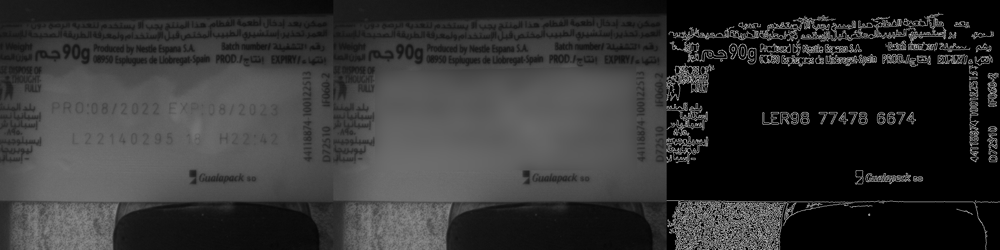

In [9]:
entry = random.choice(list(Annotations.values()))
file = entry["file"]
drawing_region = entry['reserve']

full_path = os.path.join(RealImagesDir, *file.split('\\'))
original_img = Image.open(full_path)

code = "LER98 77478 6674"
font_scale = 1.2

_ , masked_img, control_img =  Image2Canny(original_img, drawing_region, code, font_scale)

make_image_grid([original_img, masked_img, control_img], rows=1, cols=3)

100%|███████████████████████████████████████████████████████████████████████████████████| 150/150 [00:30<00:00,  4.94it/s]


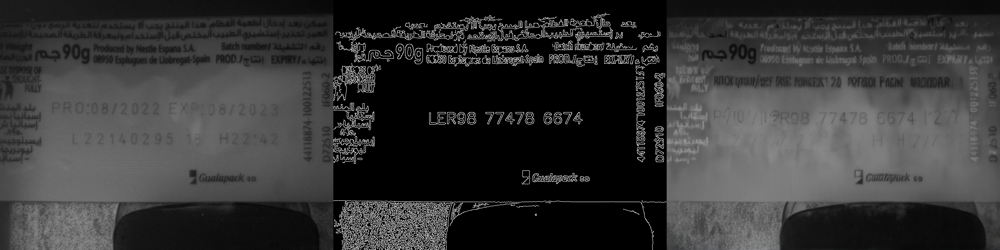

In [19]:
generator = torch.Generator(device="cpu").manual_seed(33)

prompt = (
    "laser-printed code area on consumer product packaging" 
)

generated_img = pipe(
    prompt=prompt,
    image=control_img,
    ip_adapter_image=original_img,
    num_inference_steps=150,
    generator=generator,
    controlnet_conditioning_scale=1.5,
).images[0]


generated_img = generated_img.resize((800, 600), Image.LANCZOS)
make_image_grid([original_img, control_img, generated_img], rows=1, cols=3)

## Trained Controlnet + Stable Difusion XL

In [5]:
import torch
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, AutoencoderKL
from diffusers.utils import load_image
from diffusers.image_processor import VaeImageProcessor

class SD3CannyImageProcessor(VaeImageProcessor):
    def __init__(self):
        super().__init__(do_normalize=False)
    def preprocess(self, image, **kwargs):
        image = super().preprocess(image, **kwargs)
        image = image * 255 * 0.5 + 0.5
        return image
    def postprocess(self, image, do_denormalize=True, **kwargs):
        do_denormalize = [True] * image.shape[0]
        image = super().postprocess(image, **kwargs, do_denormalize=do_denormalize)
        return image

torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

controlnet_path = "/mnt/DADES/home/jgarcia/CODE/6) STYLE TRANSFER/ConrolNet Training/output"

controlnet = ControlNetModel.from_pretrained(
    controlnet_path, torch_dtype=torch.float16
)
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", controlnet=controlnet, vae=vae, torch_dtype=torch.float16
)

pipe.to(device)

Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  3.79it/s]


StableDiffusionXLControlNetPipeline {
  "_class_name": "StableDiffusionXLControlNetPipeline",
  "_diffusers_version": "0.34.0.dev0",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "controlnet": [
    "diffusers",
    "ControlNetModel"
  ],
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

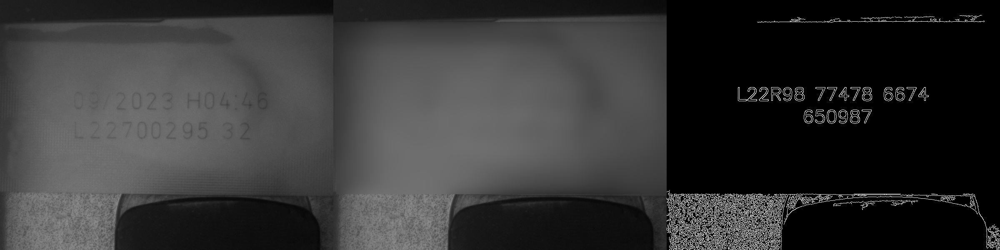

In [13]:
idx = 300
entry = Annotations[str(idx)]
file = entry["file"]
drawing_region = entry['reserve']

full_path = os.path.join(RealImagesDir, *file.split('\\'))
original_img = Image.open(full_path)

code = "L22R98 77478 6674\n 650987"
font_scale = 1.4

_ , masked_img, control_img =  Image2Canny(original_img, drawing_region, code, font_scale)

make_image_grid([original_img, masked_img, control_img], rows=1, cols=3)

100%|██████████| 20/20 [00:09<00:00,  2.15it/s]


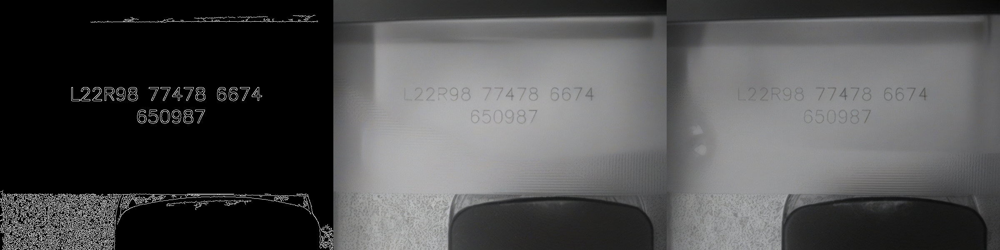

In [14]:
prompt = (
    "Grayscale close-up of a laser-printed label on industrial packaging."
)

num_gen_img = 2

generated_imgs = pipe(
    prompt, 
    image=control_img.convert("RGB").resize((800, 800)), 
    num_inference_steps=20,
    num_images_per_prompt=num_gen_img,
    controlnet_conditioning_scale=1.2,
).images

control_img = control_img.resize((800, 600), Image.LANCZOS)

for i in range(len(generated_imgs)):
    generated_imgs[i] = generated_imgs[i].resize((800, 600), Image.LANCZOS)

make_image_grid([control_img, *generated_imgs], rows=1, cols=num_gen_img + 1)